In [1]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import json
import time
from datetime import datetime, timedelta
from shapely.geometry import Point
from busSim import BusSim

In [2]:
DATA_PATH = "./data"
DAY = "monday"
START_TIME = "12:00:00"
ELAPSE_TIME = "00:30:00"
AVG_WALKING_SPEED = 1.4 # 1.4 meters per second
MAX_WALKING_MIN = 10

32090055.215094768


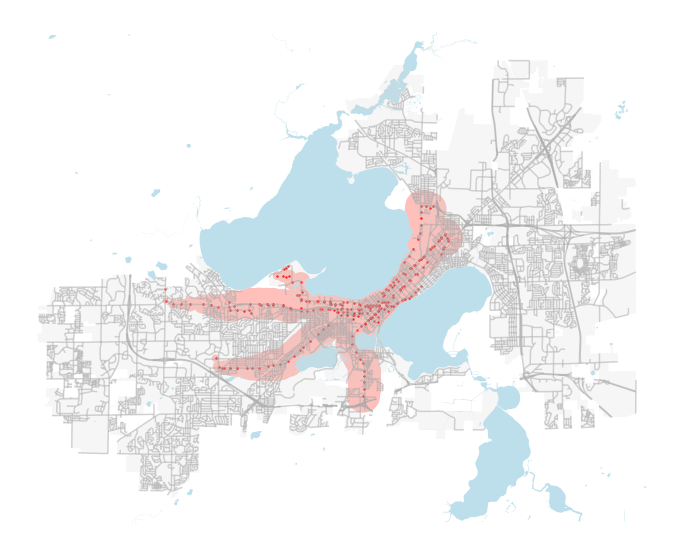

In [3]:
busSim = BusSim(DATA_PATH, DAY, START_TIME, ELAPSE_TIME, AVG_WALKING_SPEED, MAX_WALKING_MIN)
gdf = busSim.get_gdf(start_point=(43.073691, -89.387407))
print(busSim.get_area(gdf)) #32092971.01932718 #32090055.215094768

gdf = gdf.to_crs(epsg=4326)
city = gpd.read_file("./data/plot/background/madison-shp")
lakes = gpd.read_file("./data/plot/background/water-shp")
street = gpd.read_file("./data/plot/background/street-shp")

ax = city.plot(color="lightgray", alpha=.2, figsize=(12, 12), zorder=2)
lakes.plot(color="lightblue", ax=ax, zorder=1, alpha=0.8)
street.plot(color="darkgray", alpha = .5, ax=ax, zorder=3)
gdf.difference(lakes.unary_union).plot(color="#ffbfba", ax=ax)
gdf["geometry"].centroid.plot(color="red", ax=ax, markersize=2)

ax.set_axis_off()


39671876.262283504


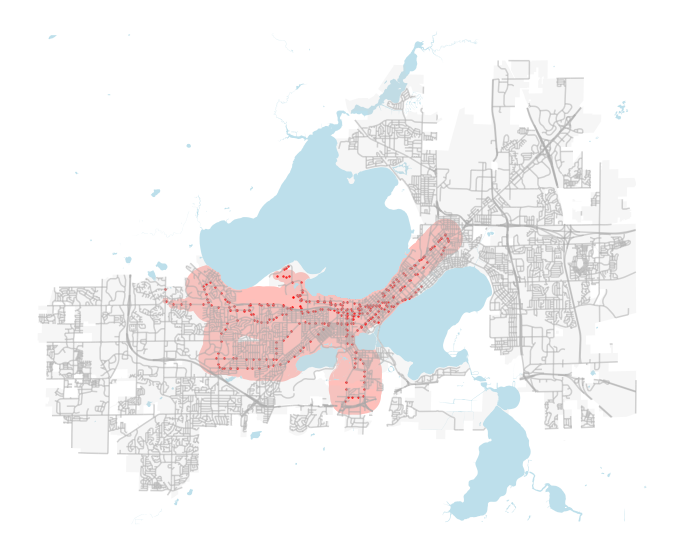

In [4]:
busSim = BusSim(DATA_PATH, DAY, START_TIME, ELAPSE_TIME, AVG_WALKING_SPEED, MAX_WALKING_MIN)
gdf = busSim.get_gdf(765)
print(busSim.get_area(gdf)) #39671876.26227871

gdf = gdf.to_crs(epsg=4326)
city = gpd.read_file("./data/plot/background/madison-shp")
lakes = gpd.read_file("./data/plot/background/water-shp")
street = gpd.read_file("./data/plot/background/street-shp")

ax = city.plot(color="lightgray", alpha=.2, figsize=(12, 12), zorder=2)
lakes.plot(color="lightblue", ax=ax, zorder=1, alpha=0.8)
street.plot(color="darkgray", alpha = .5, ax=ax, zorder=3)
gdf.difference(lakes.unary_union).plot(color="#ffbfba", ax=ax)
gdf["geometry"].centroid.plot(color="red", ax=ax, markersize=2)

ax.set_axis_off()

# Transformer Accuracy

In [9]:
from math import sin, cos, asin, sqrt, pi, ceil, floor
from pyproj import Transformer
import pandas as pd
import time


transformer = Transformer.from_crs(4326, 3174)
t0 = time.time()
transformer.transform(43.073691, -89.387407)
# t1 = time.time()

# t1 - t0

(598947.0254638451, 734629.2419716021)

In [16]:
def ans(lat1, lon1, lat2, lon2):
    lat1, lon1, lat2, lon2 = (
        a/180*pi for a in [lat1, lon1, lat2, lon2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2) ** 2 + cos(lat1) * cos(lat2) * sin(dlon/2) ** 2
    c = 2 * asin(min(1, sqrt(a)))
    return 3956 * 1609.344 * c

def estimate(x1, y1, x2, y2):
    return sqrt((x2 - x1)**2 + (y2 - y1)**2)

In [24]:
df = pd.DataFrame()
stops_df = pd.read_csv("./data/mmt_gtfs/stops-3174.csv", sep=",")
stop_li = stops_df.values.tolist()
for i in range(len(stop_li) - 1):
    x = ans(stop_li[i][5], stop_li[i][6], stop_li[i+1][5], stop_li[i+1][6])
    x_hat = estimate(stop_li[i][-2], stop_li[i][-1], stop_li[i+1][-2], stop_li[i+1][-1])
    df.loc[i, "x_hat"] = x_hat
    df.loc[i, "x"] = x
    # ((x_hat-x) / x)

In [7]:
(5613.216635128269 - 5605) / 5605

0.0014659473913058779

In [26]:
df["error"] = (df["x_hat"] - df["x"]) / df["x"]

<AxesSubplot:>

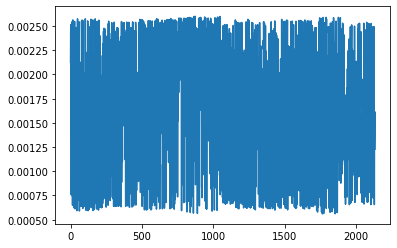

In [30]:
df["error"].plot()